In [87]:
import matplotlib.pyplot as plt
import numpy as np
import sawg
import sawg.segmentation
import sawg.hpc
import os

In [88]:
data_path = '//allen/programs/celltypes/workgroups/rnaseqanalysis/NHP_spatial/BGI/C01541A4B6/'

# MERSCOPE detected transcripts CSV file
gem_file = data_path + 'gem_files/C01541A4B6.tissue.gem'

# path to TIFF image mosaic
image_file = data_path + 'Register/C01541A4B6_regist.tif'

# npz cache file (for faster loading, since CSV is very slow) 
cache_file = gem_file + '.npz'

# path to save segmented tiles
tile_save_path = os.path.join(data_path, 'segmentation')

# file to store fully segmented and merged per-spot cell IDS
segmentation_file = os.path.join(data_path, 'segmentation.npy')

# AnnData file containing cell-by-gene matrix and x,y positions
anndata_file = os.path.join(data_path, 'cell_by_gene.h5ad')

In [3]:
# import czifile
# im = czifile.imread(image_file)
# plt.imshow(im[0, 0, :, :, 0])

In [89]:
spot_table = sawg.SpotTable.load_stereoseq(gem_file=gem_file, skiprows=7, cache_file=cache_file, image_file=image_file, image_channel='nuclear')

Loading gem...


  0%|          | 0/14155524072 [00:00<?, ?it/s]

Recompressing to npz..


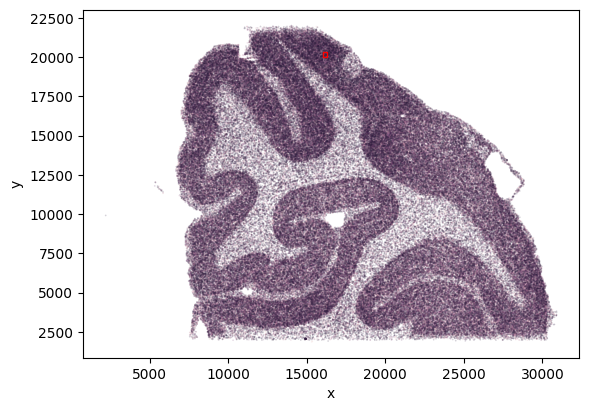

In [114]:
fig, ax = plt.subplots()

spot_table[::3000].scatter_plot(ax=ax)
subrgn = ((16000, 16300), (20000, 20300))
subtable = spot_table.get_subregion(xlim=subrgn[0], ylim=subrgn[1])
subtable.plot_rect(ax=ax, color='red')

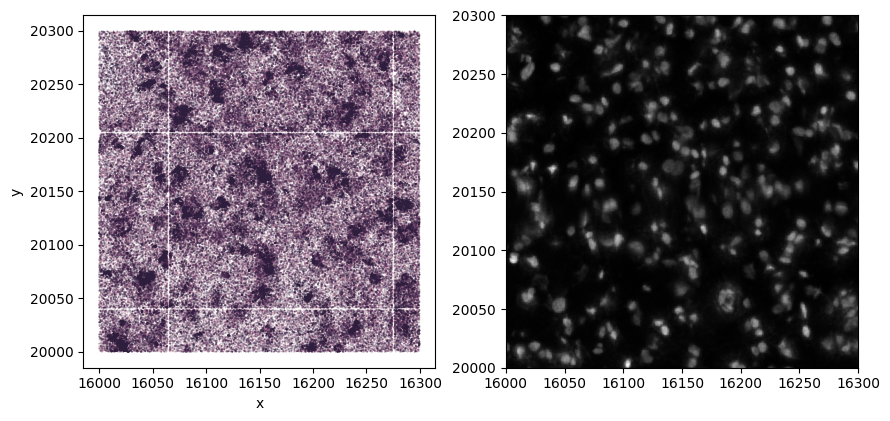

In [115]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
subtable.scatter_plot(ax=ax[0])
subtable.get_image(channel='nuclear').show(ax=ax[1], frame='mean', cmap='gray')#, vmax=5000)

In [30]:
imgs = ax[1].get_images()
imgs[0].get_clim()

(462.0, 8171.0)

Alignment looks good, but the correspondence between mrna density and nuclear staining is not great..

## Test segmentation algorithms

Try segmenting using nuclei plus a small dilation

In [98]:
seg_2d = sawg.segmentation.CellposeSegmentationMethod(options={
    'region': None,
    'cellpose_model': 'nuclei',
    'cellpose_gpu': True,
    'px_size': 0.5,          # um / px
    'cell_dia': 8,             # um
    'z_plane_thickness': 1.5,
    'images': {'nuclei': {'channel': 'nuclear', 'frame': 0}}, 
    'cellpose_options': {
        'batch_size': 8,
    },
    'dilate': 3, #um
})
result_2d = seg_2d.run(subtable)

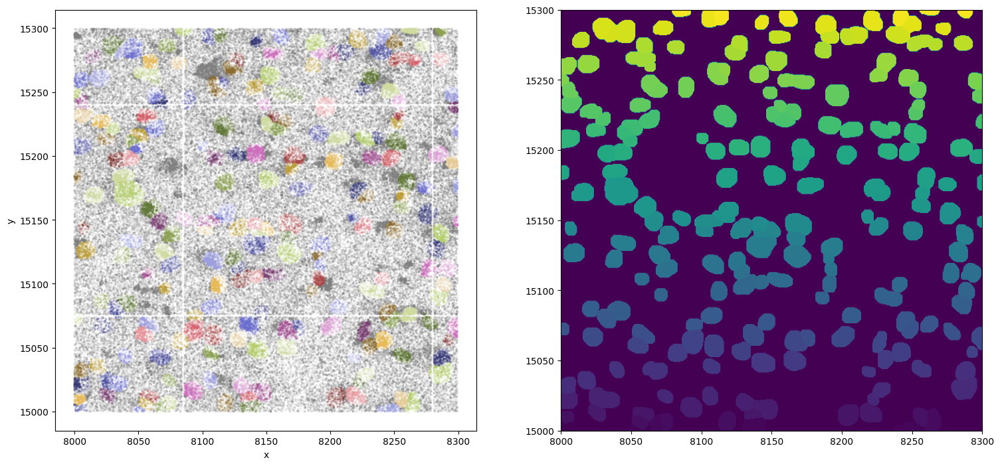

In [99]:
fig, ax = plt.subplots(1, 2, figsize=(18, 9))

result_2d.mask_image.show(ax[1])
result_2d.spot_table().scatter_plot(ax=ax[0], color='cell', size=5, alpha=0.1)


Try again using total mrna as cytosol signal

In [100]:
seg_tot_mrna_plus_nuc = sawg.segmentation.CellposeSegmentationMethod(options={
    'region': None,
    'cellpose_model': 'cyto2',
    'cellpose_gpu': True,
    'px_size': 0.5,          # um / px
    'cell_dia': 8,             # um
    'z_plane_thickness': 1.5,
    'images': {
        'cyto': {'channel': 'total_mrna', 'gauss_kernel': (1, 3, 3), 'median_kernel': (2, 10, 10)}, 
        'nuclei': {'channel': 'nuclear', 'frame': 0},
    },
    'cellpose_options': {
        'batch_size': 8,
    },
})
result_tot_mrna_plus_nuc = seg_tot_mrna_plus_nuc.run(subtable)

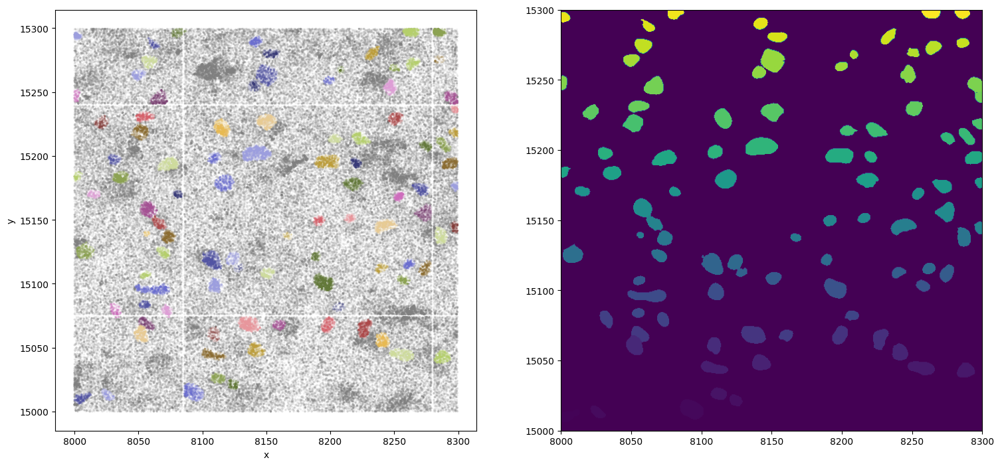

In [101]:
fig, ax = plt.subplots(1, 2, figsize=(18, 9))

result_tot_mrna_plus_nuc.mask_image.show(ax[1])
result_tot_mrna_plus_nuc.spot_table().scatter_plot(ax=ax[0], color='cell', size=5, alpha=0.1)

Yet again, this time using only mrna

In [116]:
seg_tot_mrna_opts = {
    'region': None,
    'cellpose_model': 'cyto2',
    'cellpose_gpu': True,
    'px_size': 0.5,          # um / px
    'cell_dia': 20,             # um
    'z_plane_thickness': 1.5,
    'images': {'cyto': {
        'channel': 'total_mrna',
        'gauss_kernel': (1, 3, 3),
        'median_kernel': (2, 10, 10)
    }, },
    'cellpose_options': {
        'batch_size': 8,
    },
}

# sample_img = subtable.get_image(channel='nuclear').get_frame(0)
seg_tot_mrna = sawg.segmentation.CellposeSegmentationMethod(options=seg_tot_mrna_opts)
result_tot_mrna = seg_tot_mrna.run(subtable)

In [117]:
subtable.bounds()

((16000.0, 16299.5), (20000.0, 20299.5))

In [118]:
seg_tot_mrna.images['cyto'].transform.matrix

array([[ 2.0e+00,  0.0e+00, -3.2e+04],
       [ 0.0e+00,  2.0e+00, -4.0e+04]])

In [119]:
seg_tot_mrna.images['cyto'].shape

(1, 599, 599, 1)

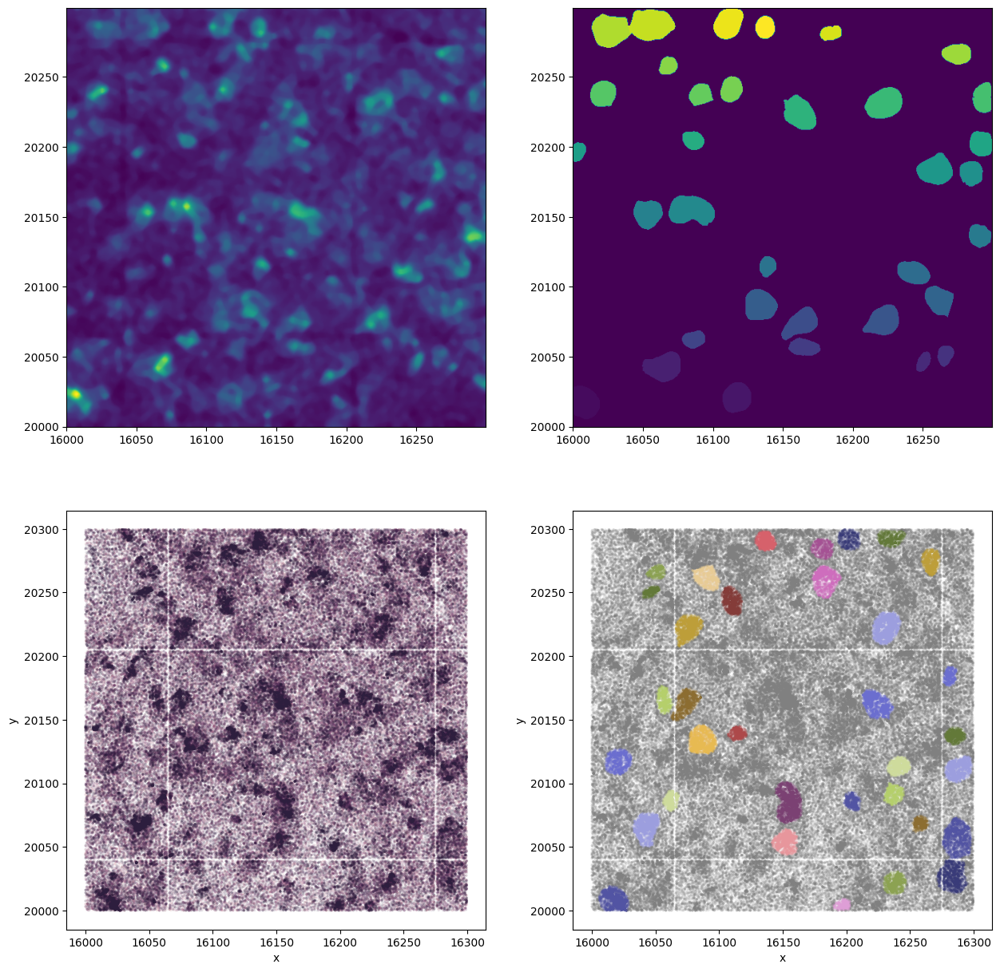

In [120]:
fig, ax = plt.subplots(2, 2, figsize=(15, 15))

seg_tot_mrna.images['cyto'].show(ax=ax[0,0])
result_tot_mrna.mask_image.show(ax[0,1])

result_tot_mrna.spot_table().scatter_plot(ax=ax[1,0], size=5, alpha=0.1)
result_tot_mrna.spot_table().scatter_plot(ax=ax[1,1], size=5, alpha=0.1, color='cell')

## Segment the entire datset on HPC

In [17]:
# split into tiles
tiles = spot_table.grid_tiles(max_tile_size=1000, overlap=30)
regions = [tile.parent_region for tile in tiles]

  0%|          | 0/22 [00:00<?, ?it/s]

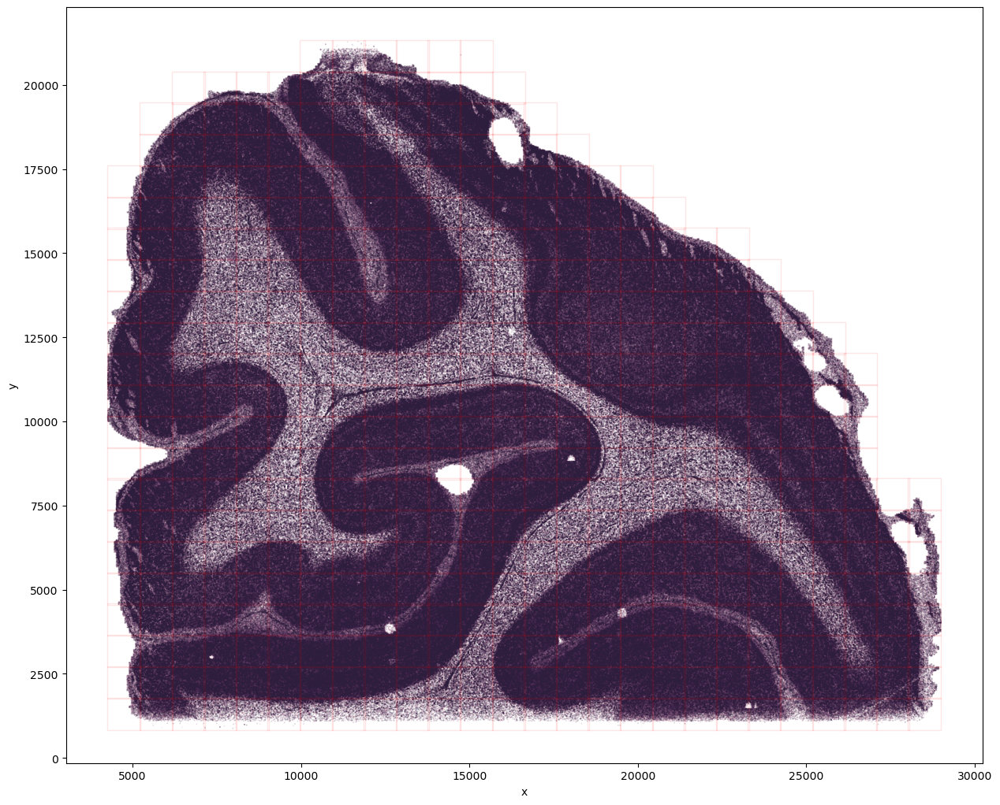

In [18]:
fig, ax = plt.subplots(figsize=(15, 15))
spot_table[::200].scatter_plot(ax=ax)
for tile in tiles:
    tile.plot_rect(ax=ax, color=(1, 0, 0, 0.1))

In [20]:
# define a segmentation method
seg_method = sawg.segmentation.CellposeSegmentationMethod

# generate specifications for segmenting each tile on HPC
if not os.path.exists(tile_save_path):
    os.mkdir(tile_save_path)
run_spec = {}
for i,tile in enumerate(tiles):
    run_spec[i] = (
        sawg.segmentation.run_segmentation,
        (),
        dict(
            load_func=sawg.SpotTable.load_stereoseq,
            load_args=dict(gem_file=gem_file, skiprows=7, cache_file=cache_file, image_file=image_file, image_channel='nuclear'),
            subregion=tile.parent_region,  # each array job will pick from a different region
            method_class=seg_method,
            method_args={'options': seg_tot_mrna_opts},
            result_file=os.path.join(tile_save_path, f'segmentation_result_{i}.pkl'),
            cell_id_file=os.path.join(tile_save_path, f'segmentation_result_{i}.npy'),
        )
    )
    
print(f"Generated segmentation spec for {len(run_spec)} tiles")

Generated segmentation spec for 469 tiles


In [24]:
# run segmentation on all tiles
jobs = sawg.hpc.run_slurm_func(
    run_spec=run_spec,
    conda_env='/allen/programs/celltypes/workgroups/rnaseqanalysis/NHP_spatial/conda-envs/sawg',
    hpc_host='hpc-login',
    job_path='/allen/programs/celltypes/workgroups/rnaseqanalysis/NHP_spatial/hpc-jobs',
    partition='celltypes', 
    job_name='test-job',
    nodes=1,
    ntasks=1,
    array=f'0-{len(run_spec)-1}',
    mincpus=1,
    gpus_per_node=1,
    mem='200G',
    time='0:30:00',
    mail_user=None,    
)

In [29]:
# wait for jobs to finish
import time, os
from tqdm.notebook import tqdm
with tqdm(total=len(jobs)) as pbar:
    while True:
        finished = [j for j in jobs if os.path.exists(j.output_file)]
        n_finished = len(finished)
        pbar.update(n_finished - pbar.n)
        print(f'{n_finished} / {len(jobs)}  {jobs.state_counts()}')
        if n_finished == len(jobs):
            break
        time.sleep(60)


  0%|          | 0/469 [00:00<?, ?it/s]

13 / 469  {'NO': 465, 'R': 4}
14 / 469  {'NO': 465, 'R': 4}
15 / 469  {'NO': 465, 'R': 4}
16 / 469  {'CG': 1, 'NO': 465, 'R': 3}
17 / 469  {'NO': 465, 'R': 4}
21 / 469  {'NO': 464, 'R': 5}
22 / 469  {'NO': 464, 'R': 5}
25 / 469  {'NO': 461, 'R': 8}
33 / 469  {'NO': 456, 'R': 13}
36 / 469  {'NO': 455, 'R': 14}
38 / 469  {'NO': 455, 'R': 14}
41 / 469  {'NO': 455, 'R': 14}
52 / 469  {'NO': 455, 'R': 14}
53 / 469  {'NO': 455, 'R': 14}
53 / 469  {'NO': 455, 'R': 14}
61 / 469  {'CG': 1, 'NO': 455, 'R': 13}
66 / 469  {'NO': 455, 'R': 14}
66 / 469  {'NO': 455, 'R': 14}
72 / 469  {'NO': 455, 'R': 14}
77 / 469  {'CG': 1, 'NO': 457, 'R': 11}
81 / 469  {'NO': 455, 'R': 14}
86 / 469  {'NO': 455, 'R': 14}
89 / 469  {'NO': 455, 'R': 14}
92 / 469  {'CG': 1, 'NO': 456, 'R': 12}
98 / 469  {'NO': 455, 'R': 14}
103 / 469  {'NO': 455, 'R': 14}
106 / 469  {'CG': 1, 'NO': 455, 'R': 13}
112 / 469  {'NO': 455, 'R': 14}
115 / 469  {'NO': 455, 'R': 14}
118 / 469  {'NO': 455, 'R': 14}
124 / 469  {'NO': 455, 'R': 

In [28]:
done = [j for j in jobs if j.is_done()]
print(f"{len(done)} / {len(jobs)}")
print(done[0].output)
print(done[0].error)

3 / 469
SLURM_JOB_ID = 9223308
Username = lukec
Group = 10513
SLURM_JOB_NODELIST = n274
Started HPC worker 1 from /allen/programs/celltypes/workgroups/rnaseqanalysis/NHP_spatial/conda-envs/sawg/bin/python
Call spec file: /allen/programs/celltypes/workgroups/rnaseqanalysis/NHP_spatial/hpc-jobs/test-job_func.pkl
Invoking callback: <function run_segmentation at 0x7ffa5dc6b250>
-----------------------------
Loading from npz..
loaded spot table 1297517465
subregion ((5212.307692307692, 6192.615384615385), (832.0, 1792.5454545454545)) 1675142
cell_ids 1675142
saved segmentation result to /allen/programs/celltypes/workgroups/rnaseqanalysis/NHP_spatial/BGI/B01307C4D6/segmentation/segmentation_result_1.pkl
saved segmentated cell IDs to /allen/programs/celltypes/workgroups/rnaseqanalysis/NHP_spatial/BGI/B01307C4D6/segmentation/segmentation_result_1.npy
-----------------------------
HPC worker complete. Callback returned:
None





In [30]:
# merge results back together

import pickle
import numpy as np
from tqdm.notebook import tqdm

spot_table.cell_ids = np.empty(len(spot_table), dtype=int)
spot_table.cell_ids[:] = -1

merge_results = []

skipped = []
for i,tile_spec in enumerate(tqdm(run_spec.values())):
#     seg_result = pickle.load(open(tile_spec[2]['output_file'], 'rb'))
    cell_id_file = tile_spec[2]['cell_id_file']
    if not os.path.exists(cell_id_file):
        print(f"Skipping tile {i} : no cell ID file generated")
        skipped.append(i)
        continue
    tile = tiles[i]
    tile.cell_ids = np.load(cell_id_file)
    result = spot_table.merge_cells(tile, padding=5)
    merge_results.append(result)
    

  0%|          | 0/469 [00:00<?, ?it/s]

In [31]:
# save segmented cell IDs
np.save(segmentation_file, spot_table.cell_ids)
print("Saved to", segmentation_file)

Saved to /allen/programs/celltypes/workgroups/rnaseqanalysis/NHP_spatial/BGI/B01307C4D6/segmentation.npy


In [5]:
# We can reload this if the notebook is restarted:
spot_table.cell_ids = np.load(segmentation_file)

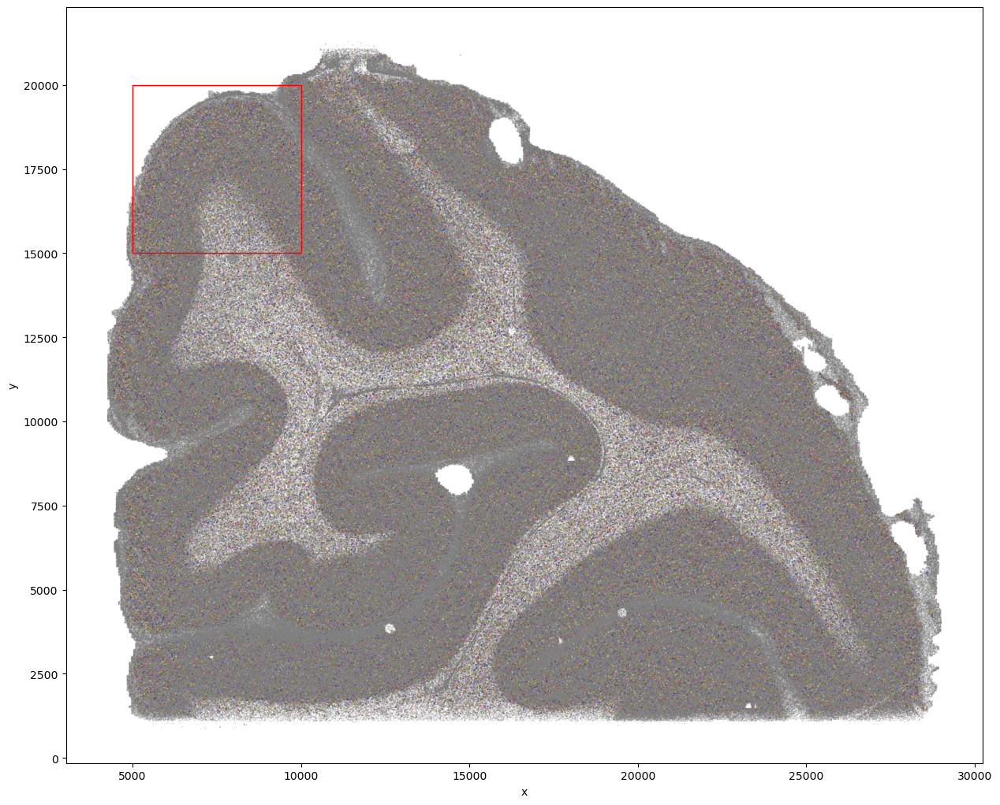

In [6]:
fig,ax = plt.subplots(figsize=(15, 15))
spot_table[::200].scatter_plot(ax=ax, color='cell')
rgn = ((5000, 10000), (15000, 20000))
subtable1 = spot_table.get_subregion(*rgn)
subtable1.plot_rect(ax=ax, color='red')

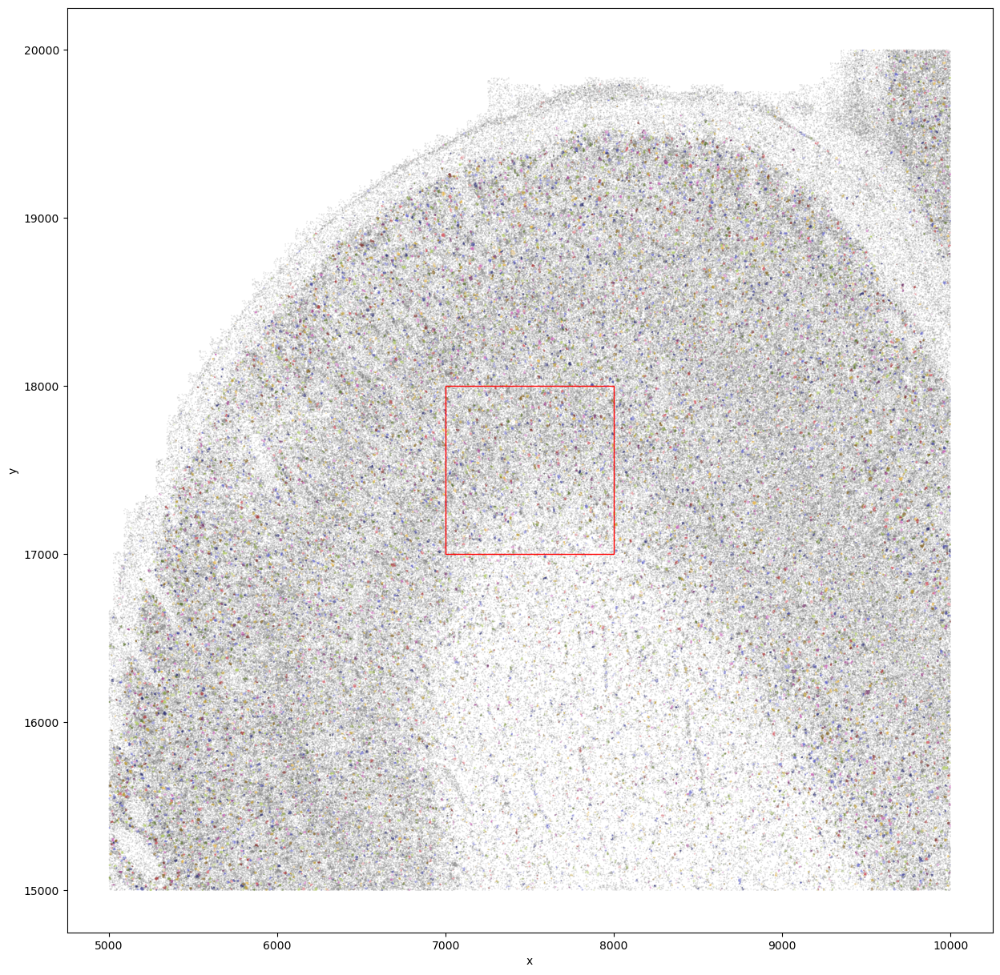

In [7]:
fig,ax = plt.subplots(figsize=(15, 15))
subtable1[::100].scatter_plot(ax=ax, color='cell')
rgn = ((7000, 8000), (17000, 18000))
subtable2 = subtable1.get_subregion(*rgn)
subtable2.plot_rect(ax=ax, color='red')

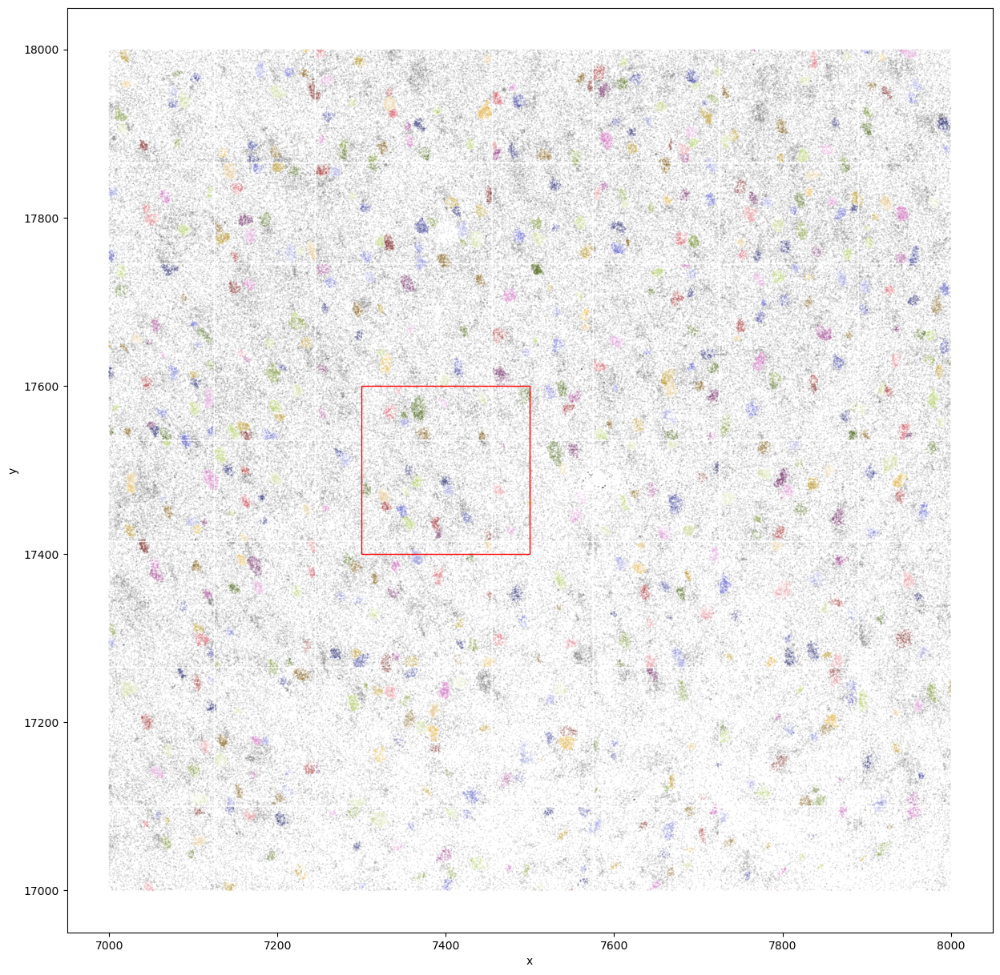

In [8]:
fig,ax = plt.subplots(figsize=(15, 15))
subtable2[::10].scatter_plot(ax=ax, color='cell')
rgn = ((7300, 7500), (17400, 17600))
subtable3 = subtable2.get_subregion(*rgn)
subtable3.plot_rect(ax=ax, color='red')

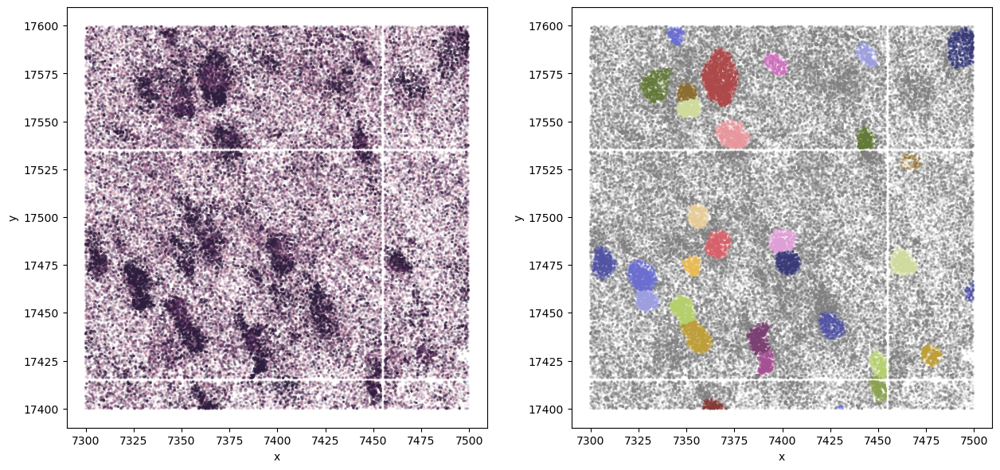

In [9]:
fig,ax = plt.subplots(1, 2, figsize=(15, 7))
subtable3.scatter_plot(ax=ax[0], size=5)
subtable3.scatter_plot(ax=ax[1], color='cell', size=5)

In [10]:
filtered_table = spot_table.filter_cells(real_cells=True, min_spot_count=300)
cell_by_gene_df = filtered_table.cell_by_gene_dataframe()

KeyboardInterrupt: 

In [ ]:
cells, counts = np.unique(filtered_table.cell_ids, return_counts=True)
cell_bounds = np.array([filtered_table.cell_bounds(cid) for cid in cells])
centroids = 0.5 * (cell_bounds[:, 1::2] + cell_bounds[:, ::2])

In [ ]:
import anndata
adata = anndata.AnnData(cell_by_gene_df)
adata.obs_names = cell_by_gene_df.index
adata.var_names = cell_by_gene_df.columns
adata.obs['x'] = centroids[:, 0]
adata.obs['y'] = centroids[:, 1]
adata.write(anndata_file)